<a href="https://colab.research.google.com/github/temurera/Anomaly_Detection/blob/main/TCN_Cascading_Forest_Anomaly_Detection_Tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Anomaly Detection Using Temporal Convolutional Network (TCN) and Cascading Forest
This tutorial explores detecting subtle anomalies using a combination of Temporal Convolutional Network (TCN) and Cascading Forest models. We introduce three types of subtle anomalies in a synthetic time series dataset:
- **Subtle Drift**
- **Amplitude Variation**
- **Frequency Shift**

### Step 1: Data Generation with Multiple Types of Subtle Anomalies
We create a synthetic time series dataset and introduce subtle anomalies at different points to test the models' detection capabilities.

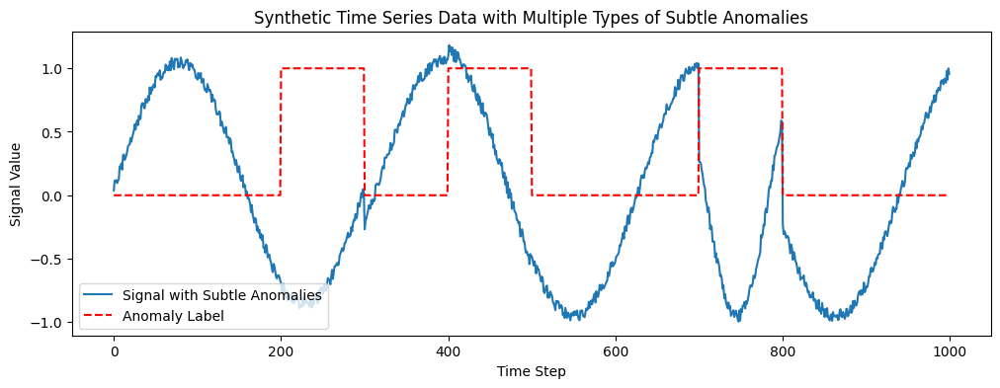

In [ ]:

import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(42)

# Generate synthetic time-series data (normal behavior)
data_length = 1000
t = np.linspace(0, 20, data_length)
X = np.sin(t).reshape(-1, 1) + 0.1 * np.random.rand(data_length, 1)  # Base signal with minor noise

# Create labels with different types of anomalies
y = np.zeros(data_length)
y[200:300] = 1  # Subtle Drift
y[400:500] = 1  # Amplitude Variation
y[700:800] = 1  # Frequency Shift

# Introduce subtle anomalies in X data

# 1. Subtle Drift (e.g., sensor drift)
X[200:300] += np.linspace(0, 0.3, 100).reshape(-1, 1)

# 2. Amplitude Variation (e.g., minor fault)
X[400:500] *= 1.1  # Slight increase in amplitude

# 3. Frequency Shift (e.g., operational condition change)
X[700:800] = np.sin(2 * t[700:800]).reshape(-1, 1) + 0.1 * np.random.rand(100, 1)

# Visualize the data with multiple subtle anomalies
plt.figure(figsize=(12, 4))
plt.plot(X, label="Signal with Subtle Anomalies")
plt.plot(y, label="Anomaly Label", color='red', linestyle='--')
plt.xlabel("Time Step")
plt.ylabel("Signal Value")
plt.legend()
plt.title("Synthetic Time Series Data with Multiple Types of Subtle Anomalies")
plt.show()


### Step 2: Temporal Convolutional Network (TCN)
A TCN is used to capture the sequential dependencies of the signal and detect anomalies based on subtle changes in the data.

In [ ]:

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten, Dropout
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Reshape X to be 3-dimensional for Conv1D layers
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train = X_train.reshape(-1, 1, 1)
X_test = X_test.reshape(-1, 1, 1)

# Define TCN model
def build_tcn_model(input_shape):
    model = Sequential([
        Conv1D(32, kernel_size=3, padding="causal", activation="relu", input_shape=input_shape),
        Dropout(0.2),
        Conv1D(64, kernel_size=3, padding="causal", activation="relu"),
        Dropout(0.2),
        Conv1D(128, kernel_size=3, padding="causal", activation="relu"),
        Flatten(),
        Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    return model

# Build and train TCN model
tcn_model = build_tcn_model((1, 1))
tcn_model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=1)

# TCN Predictions
tcn_preds = (tcn_model.predict(X_test) > 0.5).astype(int)
print("\nTCN Model Classification Report:")
print(classification_report(y_test, tcn_preds))


Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6850 - loss: 0.6759
Epoch 2/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6822 - loss: 0.6141
Epoch 3/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6998 - loss: 0.6003
Epoch 4/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6642 - loss: 0.6215
Epoch 5/5
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6856 - loss: 0.6058
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

TCN Model Classification Report:
              precision    recall  f1-score   support

         0.0       0.72      1.00      0.84       216
         1.0       0.00      0.00      0.00        84

    accuracy                           0.72       300
   macro avg       0.36      0.50      0.42       300
weighted avg       0.52      0.72      0.60       300



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### Step 3: Cascading Forest Model
The Cascading Forest model processes data in layers, each layer refining the predictions. This approach leverages Random Forests for detecting anomalies in a layered decision-making structure.

In [ ]:

from sklearn.ensemble import RandomForestClassifier

class CascadingForest:
    def __init__(self, n_layers=3, n_estimators=50, random_state=42):
        self.n_layers = n_layers
        self.random_state = random_state
        self.n_estimators = n_estimators
        self.models = [RandomForestClassifier(n_estimators=n_estimators, random_state=random_state) for _ in range(n_layers)]

    def fit(self, X, y):
        X_layer = X.copy()
        for layer in range(self.n_layers):
            self.models[layer].fit(X_layer, y)
            # Add predictions as new features for the next layer
            preds = self.models[layer].predict_proba(X_layer)[:, 1].reshape(-1, 1)
            X_layer = np.hstack((X_layer, preds))

    def predict(self, X):
        X_layer = X.copy()
        for layer in range(self.n_layers):
            preds = self.models[layer].predict_proba(X_layer)[:, 1].reshape(-1, 1)
            X_layer = np.hstack((X_layer, preds))
        return (X_layer[:, -1] > 0.5).astype(int)

# Prepare data for Cascading Forest
X_train_2D = X_train.reshape(-1, 1)
X_test_2D = X_test.reshape(-1, 1)

# Train and evaluate Cascading Forest model
cascade_forest = CascadingForest(n_layers=3, n_estimators=50)
cascade_forest.fit(X_train_2D, y_train)
cascade_preds = cascade_forest.predict(X_test_2D)

print("\nCascading Forest Classification Report:")
print(classification_report(y_test, cascade_preds))



Cascading Forest Classification Report:
              precision    recall  f1-score   support

         0.0       0.78      0.72      0.75       216
         1.0       0.40      0.49      0.44        84

    accuracy                           0.65       300
   macro avg       0.59      0.60      0.59       300
weighted avg       0.68      0.65      0.66       300



### Step 4: Combined Model - TCN + Cascading Forest
In the combined model, TCN predictions are used as additional features for the Cascading Forest model, integrating both sequential pattern recognition and multi-layered decision-making.

In [ ]:

# Use TCN predictions as additional features for Cascading Forest
tcn_train_preds = (tcn_model.predict(X_train) > 0.5).astype(int)
tcn_test_preds = (tcn_model.predict(X_test) > 0.5).astype(int)

# Combine TCN predictions with original 2D data for Cascading Forest
X_train_combined = np.hstack((X_train_2D, tcn_train_preds))
X_test_combined = np.hstack((X_test_2D, tcn_test_preds))

# Train Cascading Forest on TCN-enhanced features
cascade_combined_model = CascadingForest(n_layers=3, n_estimators=50)
cascade_combined_model.fit(X_train_combined, y_train)

# Evaluate combined model
combined_preds = cascade_combined_model.predict(X_test_combined)
print("\nCombined TCN + Cascading Forest Classification Report:")
print(classification_report(y_test, combined_preds))


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

Combined TCN + Cascading Forest Classification Report:
              precision    recall  f1-score   support

         0.0       0.79      0.71      0.75       216
         1.0       0.40      0.50      0.45        84

    accuracy                           0.65       300
   macro avg       0.59      0.61      0.60       300
weighted avg       0.68      0.65      0.66       300



### Step 5: Analysis and Comparison of Model Performance
We compare the performance of each model by analyzing their classification reports, focusing on precision, recall, and F1-score for each anomaly type.

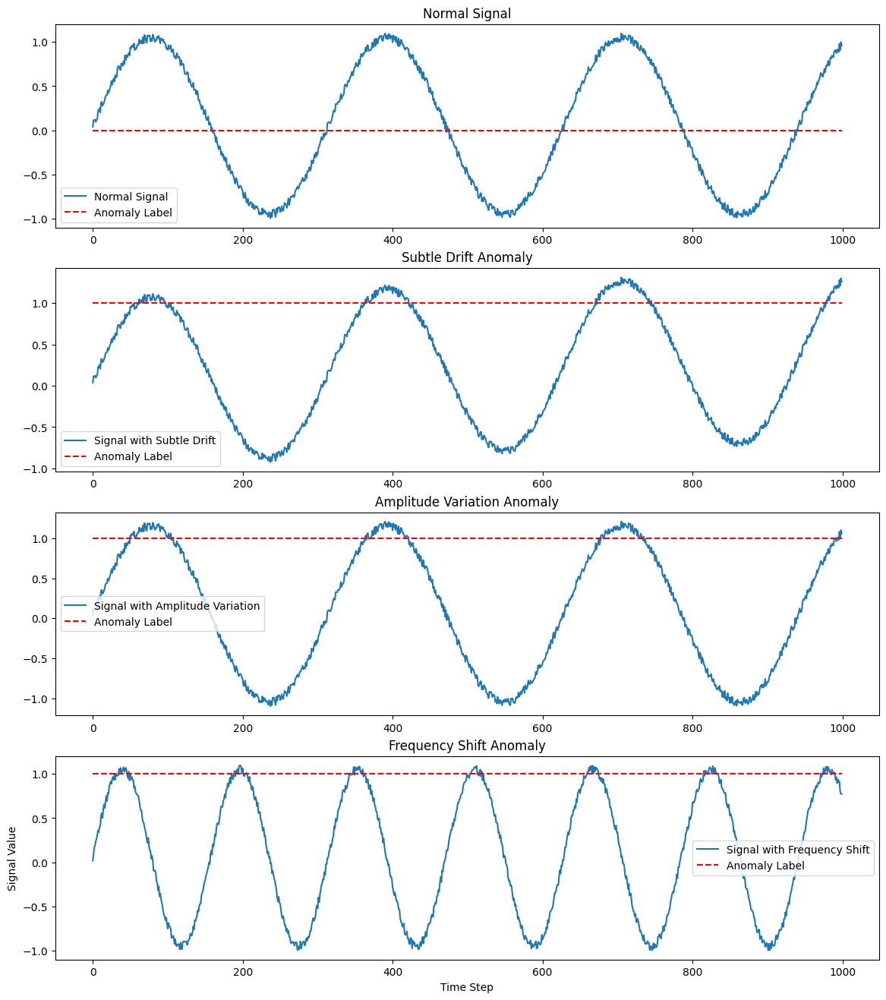

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(42)

# Generate synthetic time-series data for each type of signal
segment_length = 1000
t = np.linspace(0, 20, segment_length)

# 1. Normal signal
normal_signal = np.sin(t).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)
normal_labels = np.zeros(segment_length)  # Labels as normal (0)

# 2. Signal with Subtle Drift
drift_signal = normal_signal.copy()
drift_signal += np.linspace(0, 0.3, segment_length).reshape(-1, 1)
drift_labels = np.ones(segment_length)  # Anomaly labels for the entire signal

# 3. Signal with Amplitude Variation
amplitude_signal = normal_signal.copy() * 1.1  # Slight increase in amplitude
amplitude_labels = np.ones(segment_length)  # Anomaly labels for the entire signal

# 4. Signal with Frequency Shift
frequency_signal = np.sin(2 * t).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)
frequency_labels = np.ones(segment_length)  # Anomaly labels for the entire signal

# Visualize each signal with its respective anomaly type
fig, axs = plt.subplots(4, 1, figsize=(14, 16))

# Plot normal signal
axs[0].plot(normal_signal, label="Normal Signal")
axs[0].plot(normal_labels, label="Anomaly Label", color='red', linestyle='--')
axs[0].set_title("Normal Signal")
axs[0].legend()

# Plot drift signal
axs[1].plot(drift_signal, label="Signal with Subtle Drift")
axs[1].plot(drift_labels, label="Anomaly Label", color='red', linestyle='--')
axs[1].set_title("Subtle Drift Anomaly")
axs[1].legend()

# Plot amplitude variation signal
axs[2].plot(amplitude_signal, label="Signal with Amplitude Variation")
axs[2].plot(amplitude_labels, label="Anomaly Label", color='red', linestyle='--')
axs[2].set_title("Amplitude Variation Anomaly")
axs[2].legend()

# Plot frequency shift signal
axs[3].plot(frequency_signal, label="Signal with Frequency Shift")
axs[3].plot(frequency_labels, label="Anomaly Label", color='red', linestyle='--')
axs[3].set_title("Frequency Shift Anomaly")
axs[3].legend()

plt.xlabel("Time Step")
plt.ylabel("Signal Value")
plt.show()


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten, Dropout
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Combine normal and subtle drift signals
X_drift = np.concatenate([normal_signal, drift_signal], axis=0)
y_drift = np.concatenate([normal_labels, drift_labels], axis=0)

# Split data for training and testing
X_train, X_test, y_train, y_test = train_test_split(X_drift, y_drift, test_size=0.3, random_state=42)
X_train = X_train.reshape(-1, 1, 1)
X_test = X_test.reshape(-1, 1, 1)

# Define TCN model
def build_tcn_model(input_shape):
    model = Sequential([
        Conv1D(32, kernel_size=3, padding="causal", activation="relu", input_shape=input_shape),
        Dropout(0.2),
        Conv1D(64, kernel_size=3, padding="causal", activation="relu"),
        Dropout(0.2),
        Conv1D(128, kernel_size=3, padding="causal", activation="relu"),
        Flatten(),
        Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    return model

# Train TCN model on subtle drift anomaly
tcn_model = build_tcn_model((1, 1))
tcn_model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=1)

# Evaluate TCN model
tcn_preds = (tcn_model.predict(X_test) > 0.5).astype(int)
print("\nTCN Model Classification Report for Subtle Drift Anomaly with Normal Signal:")
print(classification_report(y_test, tcn_preds))


Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5053 - loss: 0.6926
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5399 - loss: 0.6866
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5115 - loss: 0.6895
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5318 - loss: 0.6877
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5240 - loss: 0.6863
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

TCN Model Classification Report for Subtle Drift Anomaly with Normal Signal:
              precision    recall  f1-score   support

         0.0       0.52      0.59      0.55       302
         1.0       0.52      0.46      0.49       298

    accuracy                           0.52       600
   macro avg       0.52      0.52      0.52       600
weighted avg       0.52      0.52      0.52       600



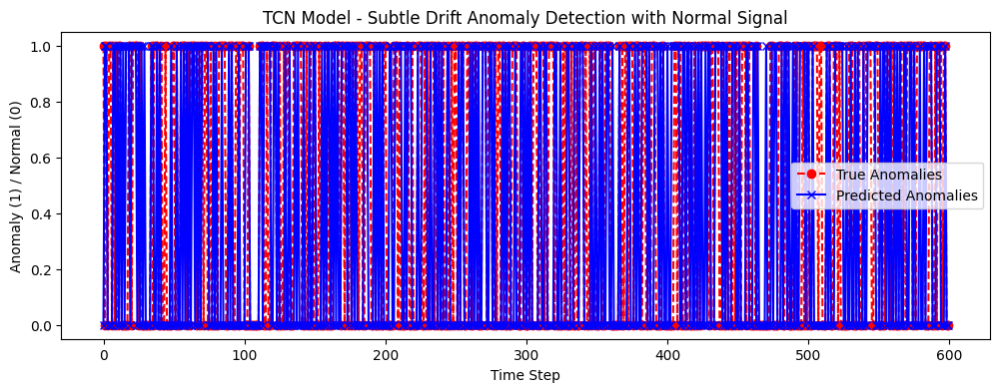

In [ ]:
import matplotlib.pyplot as plt

def plot_anomaly_results(y_true, y_pred, title="Anomaly Detection Results"):
    plt.figure(figsize=(12, 4))
    plt.plot(y_true, label="True Anomalies", color="red", linestyle="--", marker="o")
    plt.plot(y_pred, label="Predicted Anomalies", color="blue", marker="x")
    plt.xlabel("Time Step")
    plt.ylabel("Anomaly (1) / Normal (0)")
    plt.legend()
    plt.title(title)
    plt.show()

# Example visualization for TCN model on subtle drift anomaly
plot_anomaly_results(y_test, tcn_preds, "TCN Model - Subtle Drift Anomaly Detection with Normal Signal")


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten, Dropout
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
import numpy as np

# Helper function to define TCN model
def build_tcn_model(input_shape):
    model = Sequential([
        Conv1D(32, kernel_size=3, padding="causal", activation="relu", input_shape=input_shape),
        Dropout(0.2),
        Conv1D(64, kernel_size=3, padding="causal", activation="relu"),
        Dropout(0.2),
        Conv1D(128, kernel_size=3, padding="causal", activation="relu"),
        Flatten(),
        Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    return model

# Helper function for Cascading Forest
class CascadingForest:
    def __init__(self, n_layers=3, n_estimators=50, random_state=42):
        self.n_layers = n_layers
        self.models = [RandomForestClassifier(n_estimators=n_estimators, random_state=random_state) for _ in range(n_layers)]

    def fit(self, X, y):
        X_layer = X.copy()
        for layer in range(self.n_layers):
            self.models[layer].fit(X_layer, y)
            preds = self.models[layer].predict_proba(X_layer)[:, 1].reshape(-1, 1)
            X_layer = np.hstack((X_layer, preds))

    def predict(self, X):
        X_layer = X.copy()
        for layer in range(self.n_layers):
            preds = self.models[layer].predict_proba(X_layer)[:, 1].reshape(-1, 1)
            X_layer = np.hstack((X_layer, preds))
        return (X_layer[:, -1] > 0.5).astype(int)

# Function to train and evaluate models for a specific anomaly type
def train_and_evaluate_models(normal_signal, anomaly_signal, anomaly_name):
    # Combine normal and anomaly signals
    X_combined = np.concatenate([normal_signal, anomaly_signal], axis=0)
    y_combined = np.concatenate([np.zeros(len(normal_signal)), np.ones(len(anomaly_signal))], axis=0)

    # Split data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_combined, y_combined, test_size=0.3, random_state=42)
    X_train_2D, X_test_2D = X_train.reshape(-1, 1), X_test.reshape(-1, 1)  # For CF model
    X_train, X_test = X_train.reshape(-1, 1, 1), X_test.reshape(-1, 1, 1)  # For TCN model

    # ---- TCN Model ----
    tcn_model = build_tcn_model((1, 1))
    tcn_model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=1)
    tcn_preds = (tcn_model.predict(X_test) > 0.5).astype(int)
    print(f"\nTCN Model Classification Report for {anomaly_name}:")
    print(classification_report(y_test, tcn_preds))

    # ---- Cascading Forest Model ----
    cf_model = CascadingForest(n_layers=3, n_estimators=50)
    cf_model.fit(X_train_2D, y_train)
    cf_preds = cf_model.predict(X_test_2D)
    print(f"\nCascading Forest Classification Report for {anomaly_name}:")
    print(classification_report(y_test, cf_preds))

    # ---- Combined Model (TCN + Cascading Forest) ----
    tcn_train_preds = (tcn_model.predict(X_train) > 0.5).astype(int)
    tcn_test_preds = (tcn_model.predict(X_test) > 0.5).astype(int)
    X_train_combined = np.hstack((X_train_2D, tcn_train_preds))
    X_test_combined = np.hstack((X_test_2D, tcn_test_preds))

    cf_combined_model = CascadingForest(n_layers=3, n_estimators=50)
    cf_combined_model.fit(X_train_combined, y_train)
    combined_preds = cf_combined_model.predict(X_test_combined)
    print(f"\nCombined Model Classification Report for {anomaly_name}:")
    print(classification_report(y_test, combined_preds))

# Generate signals for each anomaly type (as in the previous steps)
segment_length = 1000
t = np.linspace(0, 20, segment_length)
normal_signal = np.sin(t).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)
drift_signal = normal_signal.copy() + np.linspace(0, 0.3, segment_length).reshape(-1, 1)
amplitude_signal = normal_signal.copy() * 1.1
frequency_signal = np.sin(2 * t).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)

# Train and evaluate models for each anomaly type
train_and_evaluate_models(normal_signal, drift_signal, "Subtle Drift Anomaly")
train_and_evaluate_models(normal_signal, amplitude_signal, "Amplitude Variation Anomaly")
train_and_evaluate_models(normal_signal, frequency_signal, "Frequency Shift Anomaly")


Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.5218 - loss: 0.6931
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5078 - loss: 0.6908
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5217 - loss: 0.6885
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5131 - loss: 0.6860
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5153 - loss: 0.6818
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step

TCN Model Classification Report for Subtle Drift Anomaly:
              precision    recall  f1-score   support

         0.0       0.58      0.31      0.41       302
         1.0       0.53      0.78      0.63       298

    accuracy                           0.54       600
   macro avg       0.56      0.54      0.52       600
weighted avg       0.56      0.54      0.52       600


Cascading Forest Classification Report for Subtle Drift Anomaly:
              precision    recall  f1-score   support

         0.0       0.57      0.55      0.56     

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5122 - loss: 0.6932
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4939 - loss: 0.6939
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5353 - loss: 0.6900
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5354 - loss: 0.6910
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5316 - loss: 0.6899
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

TCN Model Classification Report for Amplitude Variation Anomaly:
              precision    recall  f1-score   support

         0.0       0.50      0.38      0.43       302
         1.0       0.49      0.61      0.54       298

    accuracy                           0.49       600
   macro avg       0.49      0.49      0.49       600
weighted avg       0.49      0.49      0.49       600


Cascading Forest Classification Report for Amplitude Variation Anomaly:
              precision    recall  f1-score   support

         0.0       0.57      0.59  

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4853 - loss: 0.6936
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5052 - loss: 0.6932
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5063 - loss: 0.6929
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5130 - loss: 0.6927
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5012 - loss: 0.6936
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

TCN Model Classification Report for Frequency Shift Anomaly:
              precision    recall  f1-score   support

         0.0       0.49      0.64      0.56       302
         1.0       0.48      0.34      0.39       298

    accuracy                           0.49       600
   macro avg       0.49      0.49      0.48       600
weighted avg       0.49      0.49      0.48       600


Cascading Forest Classification Report for Frequency Shift Anomaly:
              precision    recall  f1-score   support

         0.0       0.50      0.50      0.50

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.5082 - loss: 0.6927
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5199 - loss: 0.6902
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5259 - loss: 0.6899
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5195 - loss: 0.6878
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5364 - loss: 0.6817
19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


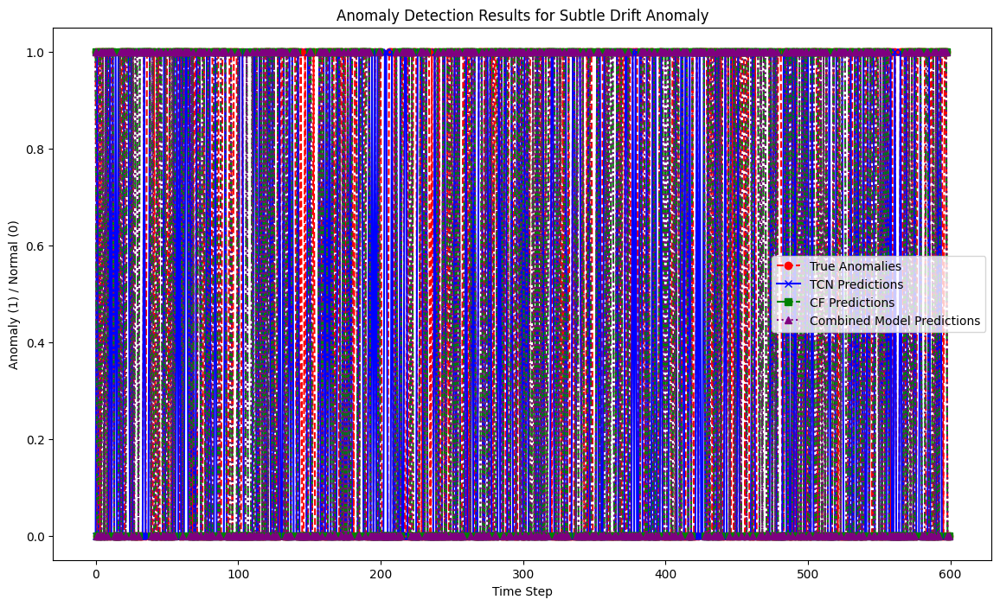

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.4662 - loss: 0.6935
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5160 - loss: 0.6926
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5174 - loss: 0.6906
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5325 - loss: 0.6905
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5098 - loss: 0.6908
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


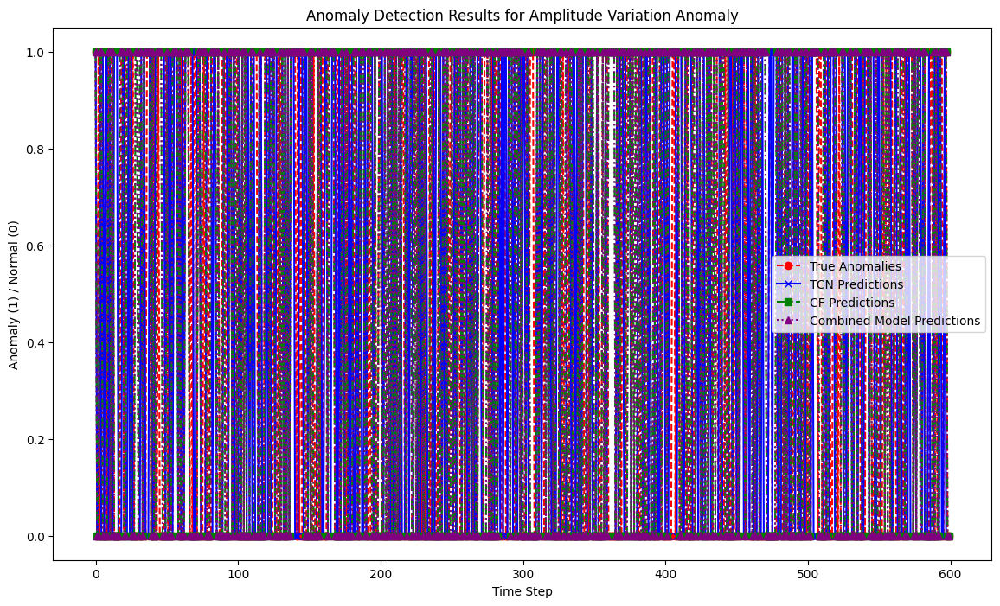

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5032 - loss: 0.6938
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4757 - loss: 0.6935
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5176 - loss: 0.6921
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5138 - loss: 0.6925
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5202 - loss: 0.6927
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


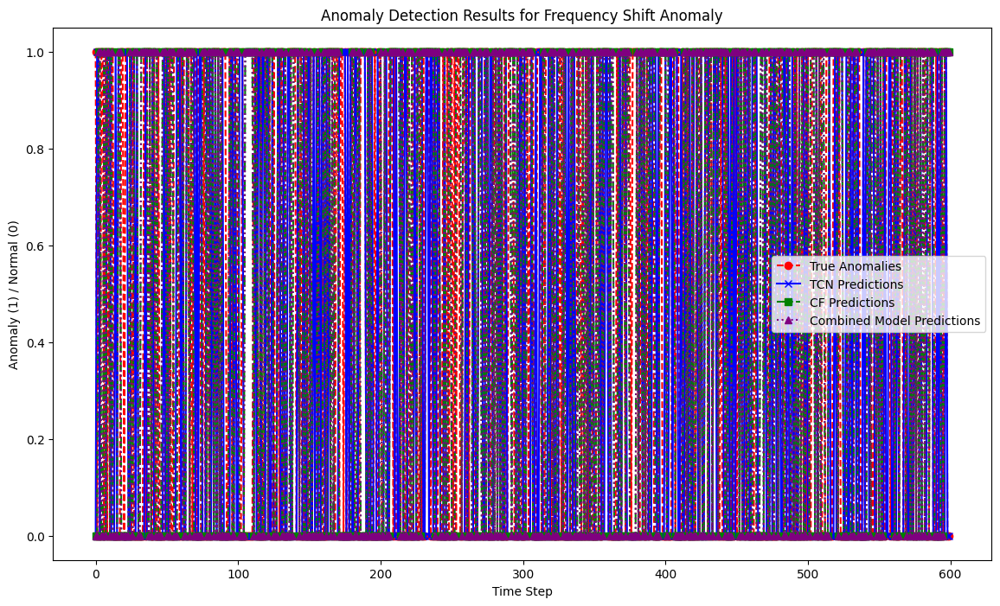

In [ ]:
import matplotlib.pyplot as plt

# Function to train, evaluate, and visualize results for a specific anomaly type
def train_evaluate_and_visualize(normal_signal, anomaly_signal, anomaly_name):
    # Combine normal and anomaly signals
    X_combined = np.concatenate([normal_signal, anomaly_signal], axis=0)
    y_combined = np.concatenate([np.zeros(len(normal_signal)), np.ones(len(anomaly_signal))], axis=0)

    # Split data for training and testing
    X_train, X_test, y_train, y_test = train_test_split(X_combined, y_combined, test_size=0.3, random_state=42)
    X_train_2D, X_test_2D = X_train.reshape(-1, 1), X_test.reshape(-1, 1)
    X_train, X_test = X_train.reshape(-1, 1, 1), X_test.reshape(-1, 1, 1)

    # ---- TCN Model ----
    tcn_model = build_tcn_model((1, 1))
    tcn_model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=1)
    tcn_preds = (tcn_model.predict(X_test) > 0.5).astype(int)

    # ---- Cascading Forest Model ----
    cf_model = CascadingForest(n_layers=3, n_estimators=50)
    cf_model.fit(X_train_2D, y_train)
    cf_preds = cf_model.predict(X_test_2D)

    # ---- Combined Model ----
    tcn_train_preds = (tcn_model.predict(X_train) > 0.5).astype(int)
    tcn_test_preds = (tcn_model.predict(X_test) > 0.5).astype(int)
    X_train_combined = np.hstack((X_train_2D, tcn_train_preds))
    X_test_combined = np.hstack((X_test_2D, tcn_test_preds))

    cf_combined_model = CascadingForest(n_layers=3, n_estimators=50)
    cf_combined_model.fit(X_train_combined, y_train)
    combined_preds = cf_combined_model.predict(X_test_combined)

    # Visualization
    plt.figure(figsize=(14, 8))
    plt.plot(y_test, label="True Anomalies", color="red", linestyle="--", marker="o")
    plt.plot(tcn_preds, label="TCN Predictions", color="blue", linestyle="-", marker="x")
    plt.plot(cf_preds, label="CF Predictions", color="green", linestyle="-.", marker="s")
    plt.plot(combined_preds, label="Combined Model Predictions", color="purple", linestyle=":", marker="^")
    plt.xlabel("Time Step")
    plt.ylabel("Anomaly (1) / Normal (0)")
    plt.legend()
    plt.title(f"Anomaly Detection Results for {anomaly_name}")
    plt.show()

# Generate signals for each anomaly type
segment_length = 1000
t = np.linspace(0, 20, segment_length)
normal_signal = np.sin(t).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)
drift_signal = normal_signal.copy() + np.linspace(0, 0.3, segment_length).reshape(-1, 1)
amplitude_signal = normal_signal.copy() * 1.1
frequency_signal = np.sin(2 * t).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)

# Visualize results for each anomaly type
plt.figure(0)
train_evaluate_and_visualize(normal_signal, drift_signal, "Subtle Drift Anomaly")
plt.figure(1)
train_evaluate_and_visualize(normal_signal, amplitude_signal, "Amplitude Variation Anomaly")
plt.figure(2)
train_evaluate_and_visualize(normal_signal, frequency_signal, "Frequency Shift Anomaly")


Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - accuracy: 0.5297 - loss: 0.6925
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5241 - loss: 0.6900
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5238 - loss: 0.6887
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5275 - loss: 0.6879
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5218 - loss: 0.6871
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step


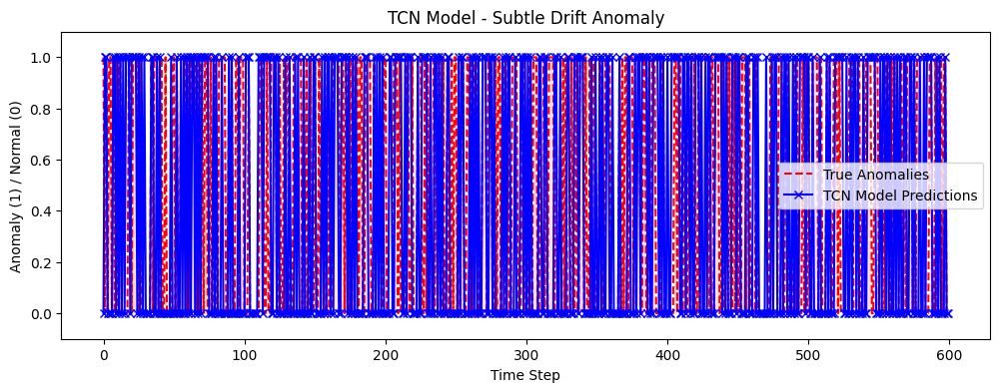

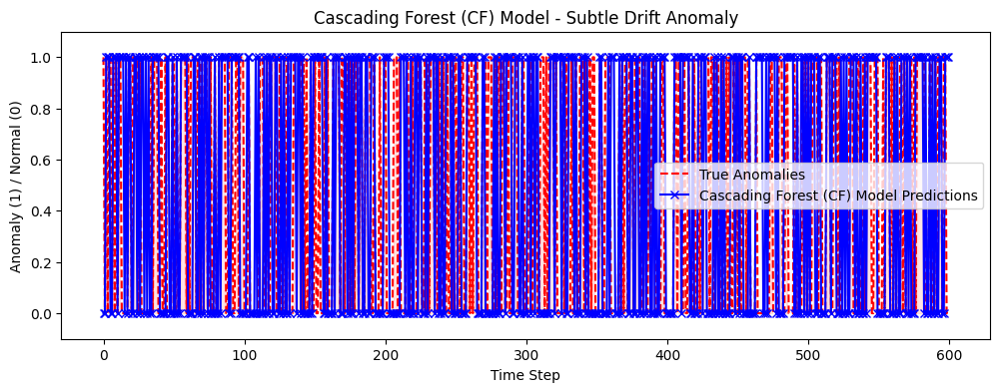

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


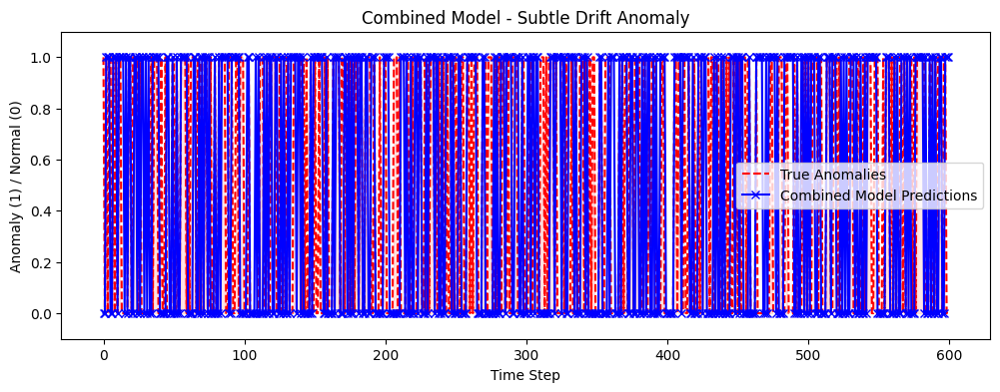

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.5068 - loss: 0.6934
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4919 - loss: 0.6922
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5029 - loss: 0.6920
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5045 - loss: 0.6915
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5290 - loss: 0.6915
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


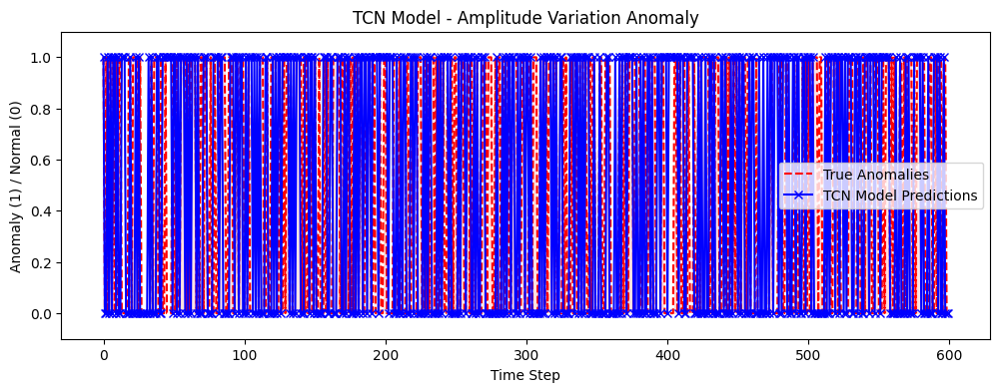

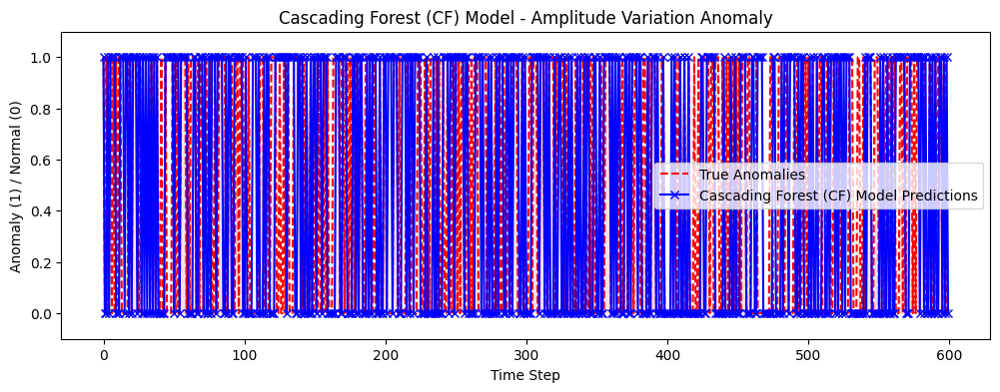

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


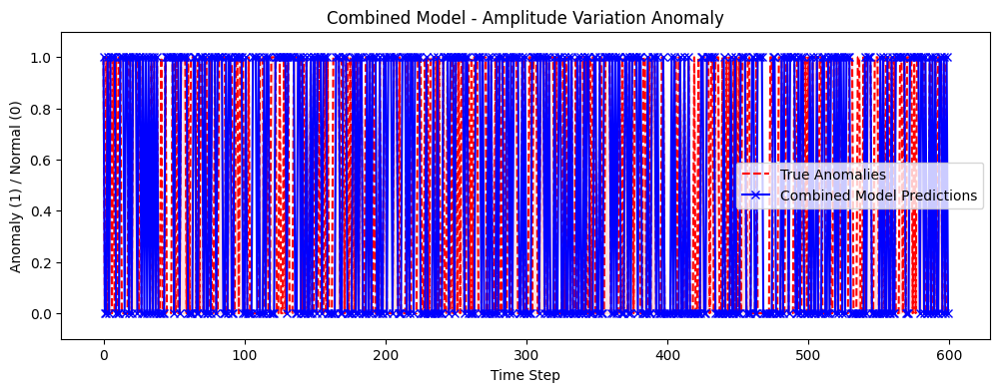

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.4879 - loss: 0.6939
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4936 - loss: 0.6932
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5029 - loss: 0.6928
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4953 - loss: 0.6932
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5167 - loss: 0.6931
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


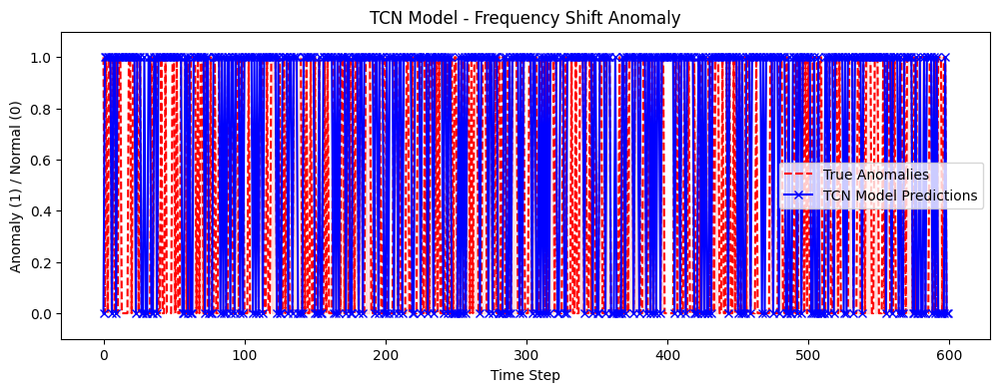

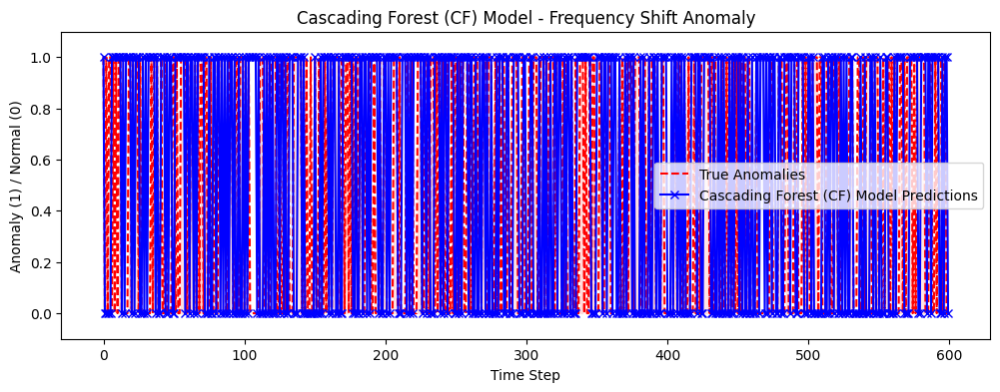

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


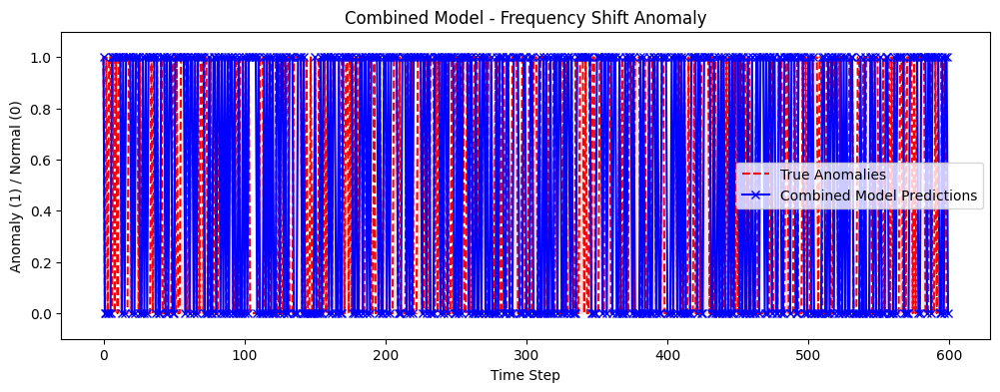

In [ ]:
import matplotlib.pyplot as plt

# Function to visualize results for a specific model and anomaly type
def plot_results(y_true, y_pred, anomaly_name, model_name):
    plt.figure(figsize=(12, 4))
    plt.plot(y_true, label="True Anomalies", color="red", linestyle="--")
    plt.plot(y_pred, label=f"{model_name} Predictions", color="blue", marker="x")
    plt.fill_between(range(len(y_true)), 0, 1, where=(y_true == 1), color="red", alpha=0.1)
    plt.xlabel("Time Step")
    plt.ylabel("Anomaly (1) / Normal (0)")
    plt.legend()
    plt.title(f"{model_name} - {anomaly_name}")
    plt.ylim([-0.1, 1.1])
    plt.show()

# Function to train, evaluate, and visualize each model separately for a given anomaly
def train_evaluate_and_visualize_model(normal_signal, anomaly_signal, anomaly_name):
    # Combine normal and anomaly signals
    X_combined = np.concatenate([normal_signal, anomaly_signal], axis=0)
    y_combined = np.concatenate([np.zeros(len(normal_signal)), np.ones(len(anomaly_signal))], axis=0)

    # Split data for training and testing
    X_train, X_test, y_train, y_test = train_test_split(X_combined, y_combined, test_size=0.3, random_state=42)
    X_train_2D, X_test_2D = X_train.reshape(-1, 1), X_test.reshape(-1, 1)  # For CF model
    X_train, X_test = X_train.reshape(-1, 1, 1), X_test.reshape(-1, 1, 1)  # For TCN model

    # ---- TCN Model ----
    tcn_model = build_tcn_model((1, 1))
    tcn_model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=1)
    tcn_preds = (tcn_model.predict(X_test) > 0.5).astype(int)
    plot_results(y_test, tcn_preds, anomaly_name, "TCN Model")

    # ---- Cascading Forest Model ----
    cf_model = CascadingForest(n_layers=3, n_estimators=50)
    cf_model.fit(X_train_2D, y_train)
    cf_preds = cf_model.predict(X_test_2D)
    plot_results(y_test, cf_preds, anomaly_name, "Cascading Forest (CF) Model")

    # ---- Combined Model ----
    tcn_train_preds = (tcn_model.predict(X_train) > 0.5).astype(int)
    tcn_test_preds = (tcn_model.predict(X_test) > 0.5).astype(int)
    X_train_combined = np.hstack((X_train_2D, tcn_train_preds))
    X_test_combined = np.hstack((X_test_2D, tcn_test_preds))

    cf_combined_model = CascadingForest(n_layers=3, n_estimators=50)
    cf_combined_model.fit(X_train_combined, y_train)
    combined_preds = cf_combined_model.predict(X_test_combined)
    plot_results(y_test, combined_preds, anomaly_name, "Combined Model")

# Generate signals for each anomaly type
segment_length = 1000
t = np.linspace(0, 20, segment_length)
normal_signal = np.sin(t).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)
drift_signal = normal_signal.copy() + np.linspace(0, 0.3, segment_length).reshape(-1, 1)
amplitude_signal = normal_signal.copy() * 1.1
frequency_signal = np.sin(2 * t).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)

# Run the visualization for each anomaly type
train_evaluate_and_visualize_model(normal_signal, drift_signal, "Subtle Drift Anomaly")
train_evaluate_and_visualize_model(normal_signal, amplitude_signal, "Amplitude Variation Anomaly")
train_evaluate_and_visualize_model(normal_signal, frequency_signal, "Frequency Shift Anomaly")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.7319 - loss: 0.6186
Epoch 2/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7590 - loss: 0.5574
Epoch 3/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7616 - loss: 0.5512
Epoch 4/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7569 - loss: 0.5551
Epoch 5/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7390 - loss: 0.5733
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


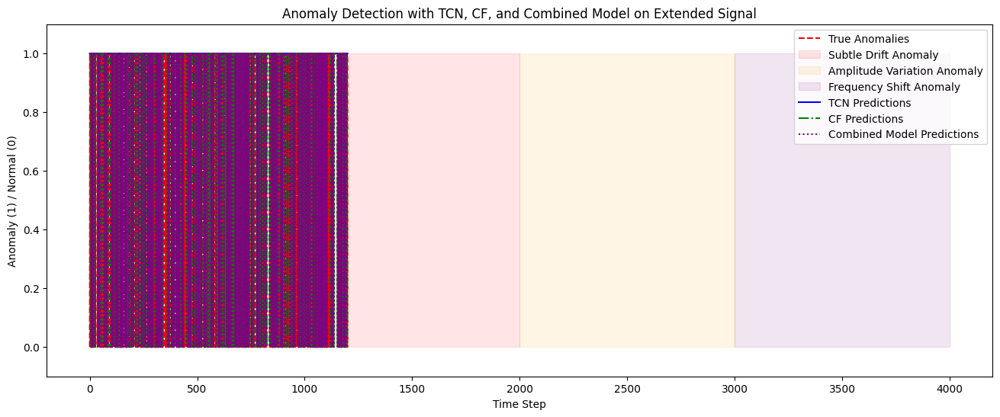

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten, Dropout
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier

# Define helper functions for TCN and Cascading Forest models
def build_tcn_model(input_shape):
    model = Sequential([
        Conv1D(32, kernel_size=3, padding="causal", activation="relu", input_shape=input_shape),
        Dropout(0.2),
        Conv1D(64, kernel_size=3, padding="causal", activation="relu"),
        Dropout(0.2),
        Conv1D(128, kernel_size=3, padding="causal", activation="relu"),
        Flatten(),
        Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    return model

class CascadingForest:
    def __init__(self, n_layers=3, n_estimators=50, random_state=42):
        self.n_layers = n_layers
        self.models = [RandomForestClassifier(n_estimators=n_estimators, random_state=random_state) for _ in range(n_layers)]

    def fit(self, X, y):
        X_layer = X.copy()
        for layer in range(self.n_layers):
            self.models[layer].fit(X_layer, y)
            preds = self.models[layer].predict_proba(X_layer)[:, 1].reshape(-1, 1)
            X_layer = np.hstack((X_layer, preds))

    def predict(self, X):
        X_layer = X.copy()
        for layer in range(self.n_layers):
            preds = self.models[layer].predict_proba(X_layer)[:, 1].reshape(-1, 1)
            X_layer = np.hstack((X_layer, preds))
        return (X_layer[:, -1] > 0.5).astype(int)

# Generate signals for each anomaly type and a longer combined dataset
segment_length = 1000
t = np.linspace(0, 20, segment_length)
normal_signal = np.sin(t).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)
drift_signal = normal_signal.copy() + np.linspace(0, 0.3, segment_length).reshape(-1, 1)
amplitude_signal = normal_signal.copy() * 1.1
frequency_signal = np.sin(2 * t).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)

# Combine all signals into a single long dataset
X_combined = np.concatenate([normal_signal, drift_signal, amplitude_signal, frequency_signal], axis=0)
y_combined = np.concatenate([np.zeros(segment_length), np.ones(segment_length), np.ones(segment_length), np.ones(segment_length)], axis=0)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_combined, y_combined, test_size=0.3, random_state=42)
X_train_2D, X_test_2D = X_train.reshape(-1, 1), X_test.reshape(-1, 1)  # For CF model
X_train, X_test = X_train.reshape(-1, 1, 1), X_test.reshape(-1, 1, 1)  # For TCN model

# Train TCN model
tcn_model = build_tcn_model((1, 1))
tcn_model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=1)
tcn_preds = (tcn_model.predict(X_test) > 0.5).astype(int)

# Train Cascading Forest model
cf_model = CascadingForest(n_layers=3, n_estimators=50)
cf_model.fit(X_train_2D, y_train)
cf_preds = cf_model.predict(X_test_2D)

# Combined Model
tcn_train_preds = (tcn_model.predict(X_train) > 0.5).astype(int)
tcn_test_preds = (tcn_model.predict(X_test) > 0.5).astype(int)
X_train_combined = np.hstack((X_train_2D, tcn_train_preds))
X_test_combined = np.hstack((X_test_2D, tcn_test_preds))

cf_combined_model = CascadingForest(n_layers=3, n_estimators=50)
cf_combined_model.fit(X_train_combined, y_train)
combined_preds = cf_combined_model.predict(X_test_combined)

# Plotting the results with shaded anomaly regions
plt.figure(figsize=(16, 6))

# True labels and shaded regions
plt.plot(range(len(y_test)), y_test, label="True Anomalies", color="red", linestyle="--")
plt.fill_betweenx([0, 1], segment_length, 2*segment_length, color='red', alpha=0.1, label="Subtle Drift Anomaly")
plt.fill_betweenx([0, 1], 2*segment_length, 3*segment_length, color='orange', alpha=0.1, label="Amplitude Variation Anomaly")
plt.fill_betweenx([0, 1], 3*segment_length, 4*segment_length, color='purple', alpha=0.1, label="Frequency Shift Anomaly")

# Plot predictions
plt.plot(range(len(y_test)), tcn_preds, label="TCN Predictions", color="blue", linestyle="-")
plt.plot(range(len(y_test)), cf_preds, label="CF Predictions", color="green", linestyle="-.")
plt.plot(range(len(y_test)), combined_preds, label="Combined Model Predictions", color="purple", linestyle=":")

# Labels and legend
plt.xlabel("Time Step")
plt.ylabel("Anomaly (1) / Normal (0)")
plt.ylim([-0.1, 1.1])
plt.xlim([0, 1500])
plt.title("Anomaly Detection with TCN, CF, and Combined Model on Extended Signal")
plt.legend()
plt.show()


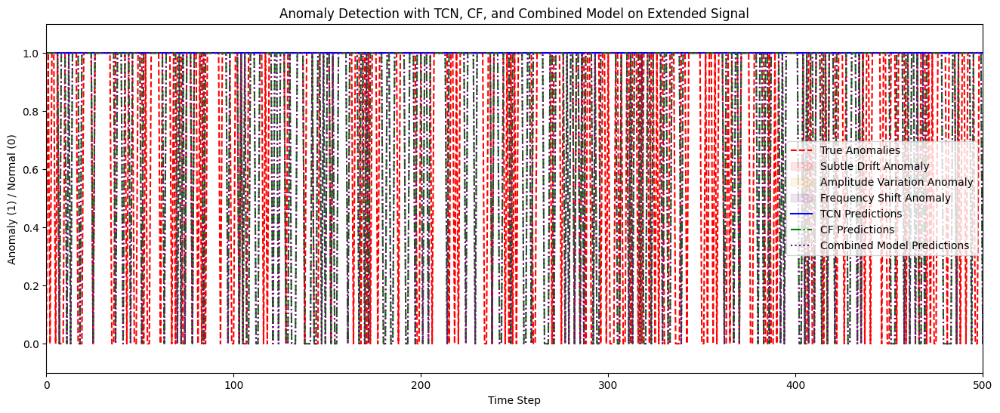

In [3]:

# Plotting the results with shaded anomaly regions
plt.figure(figsize=(16, 6))

# True labels and shaded regions
plt.plot(range(len(y_test)), y_test, label="True Anomalies", color="red", linestyle="--")
plt.fill_betweenx([0, 1], segment_length, 2*segment_length, color='red', alpha=0.1, label="Subtle Drift Anomaly")
plt.fill_betweenx([0, 1], 2*segment_length, 3*segment_length, color='orange', alpha=0.1, label="Amplitude Variation Anomaly")
plt.fill_betweenx([0, 1], 3*segment_length, 4*segment_length, color='purple', alpha=0.1, label="Frequency Shift Anomaly")

# Plot predictions
plt.plot(range(len(y_test)), tcn_preds, label="TCN Predictions", color="blue", linestyle="-")
plt.plot(range(len(y_test)), cf_preds, label="CF Predictions", color="green", linestyle="-.")
plt.plot(range(len(y_test)), combined_preds, label="Combined Model Predictions", color="purple", linestyle=":")

# Labels and legend
plt.xlabel("Time Step")
plt.ylabel("Anomaly (1) / Normal (0)")
plt.ylim([-0.1, 1.1])
plt.xlim([0, 500])
plt.title("Anomaly Detection with TCN, CF, and Combined Model on Extended Signal")
plt.legend()
plt.show()

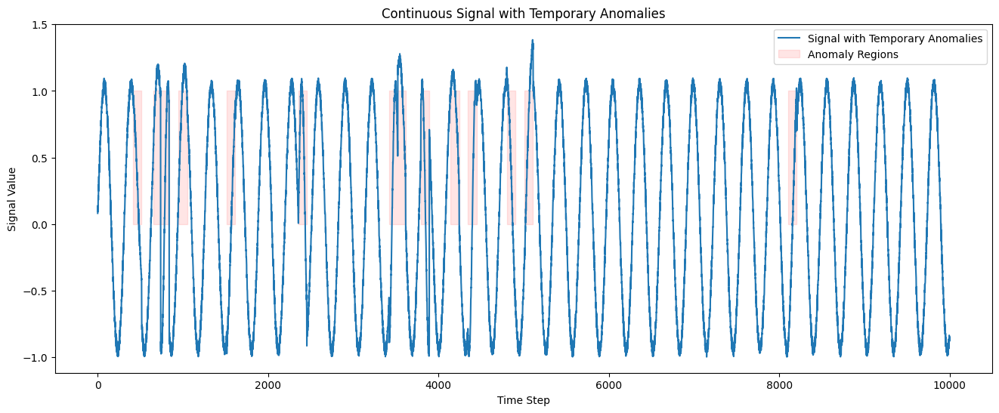

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.8579 - loss: 0.4803
Epoch 2/5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8655 - loss: 0.3789
Epoch 3/5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.8686 - loss: 0.3706
Epoch 4/5
219/219 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.8623 - loss: 0.3767
Epoch 5/5
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8682 - loss: 0.3688
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


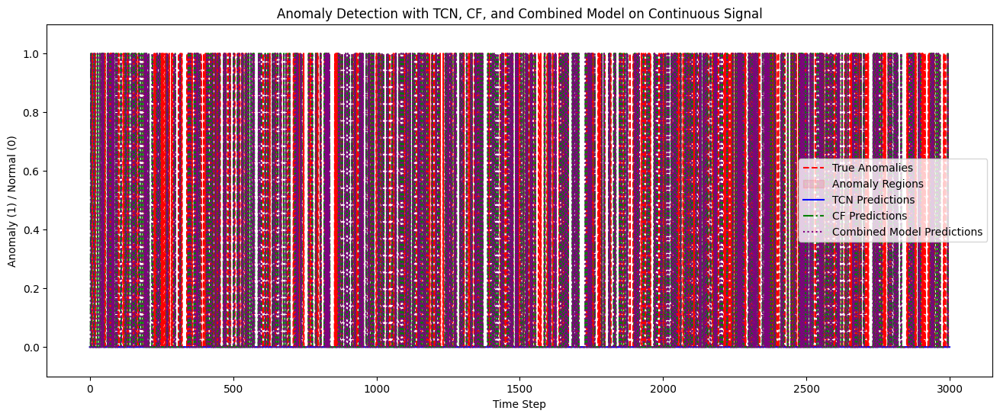

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten, Dropout
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier

# Helper functions to define models
def build_tcn_model(input_shape):
    model = Sequential([
        Conv1D(32, kernel_size=3, padding="causal", activation="relu", input_shape=input_shape),
        Dropout(0.2),
        Conv1D(64, kernel_size=3, padding="causal", activation="relu"),
        Dropout(0.2),
        Conv1D(128, kernel_size=3, padding="causal", activation="relu"),
        Flatten(),
        Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    return model

class CascadingForest:
    def __init__(self, n_layers=3, n_estimators=50, random_state=42):
        self.n_layers = n_layers
        self.models = [RandomForestClassifier(n_estimators=n_estimators, random_state=random_state) for _ in range(n_layers)]

    def fit(self, X, y):
        X_layer = X.copy()
        for layer in range(self.n_layers):
            self.models[layer].fit(X_layer, y)
            preds = self.models[layer].predict_proba(X_layer)[:, 1].reshape(-1, 1)
            X_layer = np.hstack((X_layer, preds))

    def predict(self, X):
        X_layer = X.copy()
        for layer in range(self.n_layers):
            preds = self.models[layer].predict_proba(X_layer)[:, 1].reshape(-1, 1)
            X_layer = np.hstack((X_layer, preds))
        return (X_layer[:, -1] > 0.5).astype(int)

# Generate a long time series with intermittent anomalies
total_length = 10000  # Length of the entire signal
segment_length = 100  # Length of each anomaly segment
t = np.linspace(0, 200, total_length)

# 1. Normal signal
normal_signal = np.sin(t).reshape(-1, 1) + 0.1 * np.random.rand(total_length, 1)
labels = np.zeros(total_length)  # Initialize labels as normal

# 2. Insert subtle drift anomalies
for start in np.random.randint(0, total_length - segment_length, size=5):
    normal_signal[start:start + segment_length] += np.linspace(0, 0.3, segment_length).reshape(-1, 1)
    labels[start:start + segment_length] = 1  # Label these points as anomalies

# 3. Insert amplitude variation anomalies
for start in np.random.randint(0, total_length - segment_length, size=5):
    normal_signal[start:start + segment_length] *= 1.1  # Increase amplitude
    labels[start:start + segment_length] = 1  # Label these points as anomalies

# 4. Insert frequency shift anomalies
for start in np.random.randint(0, total_length - segment_length, size=5):
    normal_signal[start:start + segment_length] = np.sin(2 * t[start:start + segment_length]).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)
    labels[start:start + segment_length] = 1  # Label these points as anomalies

# Visualize the data with shaded anomaly regions
plt.figure(figsize=(16, 6))
plt.plot(normal_signal, label="Signal with Temporary Anomalies")
plt.fill_between(range(total_length), 0, 1, where=(labels == 1), color="red", alpha=0.1, label="Anomaly Regions")
plt.xlabel("Time Step")
plt.ylabel("Signal Value")
plt.legend()
plt.title("Continuous Signal with Temporary Anomalies")
plt.show()

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(normal_signal, labels, test_size=0.3, random_state=42)
X_train_2D, X_test_2D = X_train.reshape(-1, 1), X_test.reshape(-1, 1)  # For CF model
X_train, X_test = X_train.reshape(-1, 1, 1), X_test.reshape(-1, 1, 1)  # For TCN model

# Train TCN model
tcn_model = build_tcn_model((1, 1))
tcn_model.fit(X_train, y_train, epochs=5, batch_size=32, verbose=1)
tcn_preds = (tcn_model.predict(X_test) > 0.5).astype(int)

# Train Cascading Forest model
cf_model = CascadingForest(n_layers=3, n_estimators=50)
cf_model.fit(X_train_2D, y_train)
cf_preds = cf_model.predict(X_test_2D)

# Combined Model
tcn_train_preds = (tcn_model.predict(X_train) > 0.5).astype(int)
tcn_test_preds = (tcn_model.predict(X_test) > 0.5).astype(int)
X_train_combined = np.hstack((X_train_2D, tcn_train_preds))
X_test_combined = np.hstack((X_test_2D, tcn_test_preds))

cf_combined_model = CascadingForest(n_layers=3, n_estimators=50)
cf_combined_model.fit(X_train_combined, y_train)
combined_preds = cf_combined_model.predict(X_test_combined)

# Plotting the results with shaded anomaly regions
plt.figure(figsize=(16, 6))

# True labels and shaded regions
plt.plot(range(len(y_test)), y_test, label="True Anomalies", color="red", linestyle="--")
plt.fill_between(range(len(y_test)), 0, 1, where=(y_test == 1), color="red", alpha=0.1, label="Anomaly Regions")

# Plot predictions
plt.plot(range(len(y_test)), tcn_preds, label="TCN Predictions", color="blue", linestyle="-")
plt.plot(range(len(y_test)), cf_preds, label="CF Predictions", color="green", linestyle="-.")
plt.plot(range(len(y_test)), combined_preds, label="Combined Model Predictions", color="purple", linestyle=":")

# Labels and legend
plt.xlabel("Time Step")
plt.ylabel("Anomaly (1) / Normal (0)")
plt.ylim([-0.1, 1.1])
plt.title("Anomaly Detection with TCN, CF, and Combined Model on Continuous Signal")
plt.legend()
plt.show()


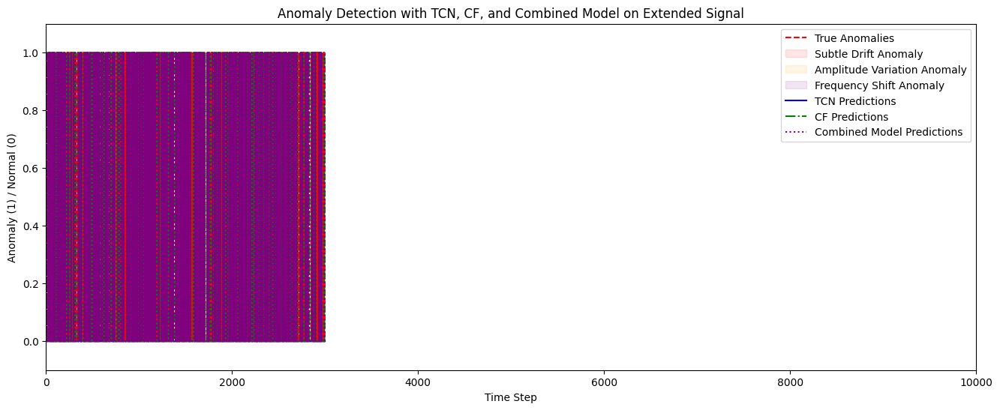

In [5]:
# Plotting the results with shaded anomaly regions
plt.figure(figsize=(16, 6))

# True labels and shaded regions
plt.plot(range(len(y_test)), y_test, label="True Anomalies", color="red", linestyle="--")
plt.fill_betweenx([0, 1], segment_length, 2*segment_length, color='red', alpha=0.1, label="Subtle Drift Anomaly")
plt.fill_betweenx([0, 1], 2*segment_length, 3*segment_length, color='orange', alpha=0.1, label="Amplitude Variation Anomaly")
plt.fill_betweenx([0, 1], 3*segment_length, 4*segment_length, color='purple', alpha=0.1, label="Frequency Shift Anomaly")

# Plot predictions
plt.plot(range(len(y_test)), tcn_preds, label="TCN Predictions", color="blue", linestyle="-")
plt.plot(range(len(y_test)), cf_preds, label="CF Predictions", color="green", linestyle="-.")
plt.plot(range(len(y_test)), combined_preds, label="Combined Model Predictions", color="purple", linestyle=":")

# Labels and legend
plt.xlabel("Time Step")
plt.ylabel("Anomaly (1) / Normal (0)")
plt.ylim([-0.1, 1.1])
plt.xlim([0, 10000])
plt.title("Anomaly Detection with TCN, CF, and Combined Model on Extended Signal")
plt.legend()
plt.show()

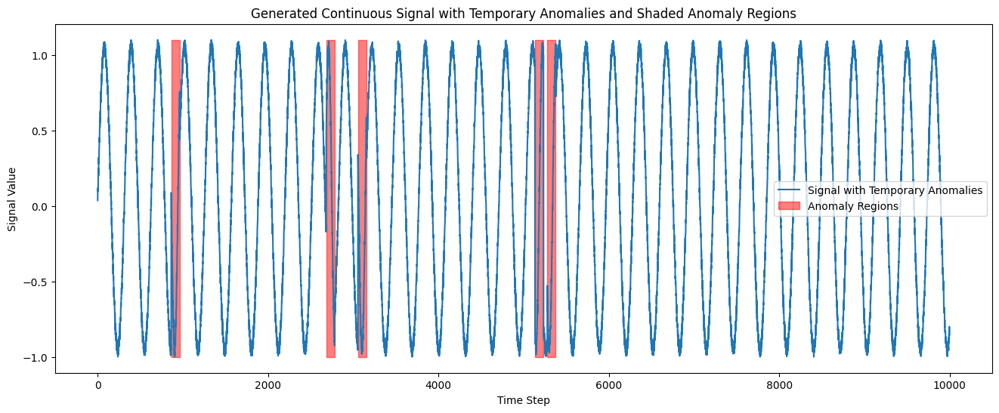

In [17]:
import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(42)

# Define parameters
total_length = 10000  # Length of the entire signal
segment_length = 100  # Length of each anomaly segment
t = np.linspace(0, 200, total_length)

# 1. Generate the normal signal
normal_signal = np.sin(t).reshape(-1, 1) + 0.1 * np.random.rand(total_length, 1)
labels = np.zeros(total_length)  # Initialize labels as normal (0)

# 2. Insert subtle drift anomalies at random locations
'''for start in np.random.randint(0, total_length - segment_length, size=5):
    normal_signal[start:start + segment_length] += np.linspace(0, 0.3, segment_length).reshape(-1, 1)
    labels[start:start + segment_length] = 1  # Label these points as anomalies

# 3. Insert amplitude variation anomalies at random locations

for start in np.random.randint(0, total_length - segment_length, size=5):
    normal_signal[start:start + segment_length] *= 1.1  # Increase amplitude
    labels[start:start + segment_length] = 1  # Label these points as anomalies
'''
# 4. Insert frequency shift anomalies at random locations
for start in np.random.randint(0, total_length - segment_length, size=5):
    normal_signal[start:start + segment_length] = np.sin(2 * t[start:start + segment_length]).reshape(-1, 1) + 0.1 * np.random.rand(segment_length, 1)
    labels[start:start + segment_length] = 1  # Label these points as anomalies

# Plot the generated signal with shaded anomaly regions
plt.figure(figsize=(16, 6))
plt.plot(normal_signal, label="Signal with Temporary Anomalies")
plt.fill_between(range(total_length),np.min(normal_signal),np.max(normal_signal), where=(labels == 1), color="red", alpha=0.5, label="Anomaly Regions")
#plt.fill_between(range(len(y_test)), 0, 1, where=(y_test == 1), color="red", alpha=0.1, label="Anomaly Regions")

plt.xlabel("Time Step")
plt.ylabel("Signal Value")
plt.title("Generated Continuous Signal with Temporary Anomalies and Shaded Anomaly Regions")
plt.legend()
plt.show()


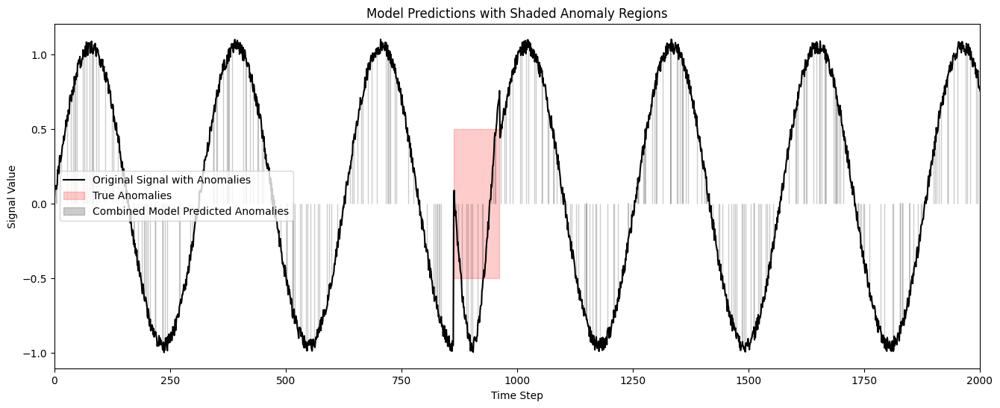

In [20]:
# Assuming the models have already been trained and predictions generated as `tcn_preds`, `cf_preds`, `combined_preds`
# The labels (true anomaly labels) are in `y_test`, and the entire signal is `normal_signal`.

# Plot the original signal with true anomalies shaded
plt.figure(figsize=(16, 6))
plt.plot(normal_signal, label="Original Signal with Anomalies", color="black")

# Overlay true anomaly regions
plt.fill_between(range(total_length), -0.5,0.5, where=(labels == 1), color="red", alpha=0.2, label="True Anomalies")

# Overlay TCN predicted anomaly regions
#plt.fill_between(range(len(y_test)), normal_signal[:len(y_test)].flatten(), where=(tcn_preds.flatten() == 1), color="blue", alpha=0.2, label="TCN Predicted Anomalies")

# Overlay Cascading Forest predicted anomaly regions
#plt.fill_between(range(len(y_test)), -1,1, where=(cf_preds.flatten() == 1), color="green", alpha=0.2, label="CF Predicted Anomalies")

# Overlay Combined Model predicted anomaly regions
plt.fill_between(range(len(y_test)), normal_signal[:len(y_test)].flatten(), where=(combined_preds.flatten() == 1), color="black", alpha=0.2, label="Combined Model Predicted Anomalies")

# Labels and legend
plt.xlabel("Time Step")
plt.ylabel("Signal Value")
plt.title("Model Predictions with Shaded Anomaly Regions")
plt.legend()
plt.xlim([-0.1, 2000])
plt.show()
